<a href="https://colab.research.google.com/github/mimiachiu/Deep-Learning-with-Python-Book/blob/master/Ch05_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [ ]:
pip install keras

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
from keras.models import load_model

Using TensorFlow backend.


In [ ]:
base_dir = '/content/drive/My Drive/Colab Notebooks/Deep Learning with Python/dogs-vs-cats/'
img_dir = base_dir + 'cats_and_dogs_small/'

In [ ]:
#5-4-1 中間層輸出的視覺化
#載入之前已經訓練好的模型
from tensorflow.keras.models import load_model #出現ValueError: Unknown initializer: GlorotUniform錯誤訊息的解決方法
model = load_model(base_dir + 'cats_and_dogs_small_2.h5')
model.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 36,

In [ ]:
img_path = img_dir + 'test/cats/cat.1700.jpg'

In [ ]:
from keras.preprocessing import image
import numpy as np

In [ ]:
#預處理單張圖片
img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
print(img_tensor.shape)

(1, 150, 150, 3)


In [ ]:
import matplotlib.pyplot as plt

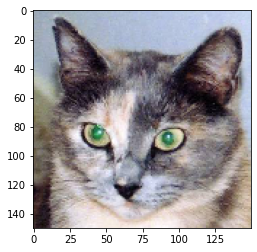

In [ ]:
plt.imshow(img_tensor[0])
plt.show()

In [ ]:
from tensorflow.keras import models #出現TypeError: object of type 'InputLayer' has no len()錯誤訊息解決方法

In [ ]:
#用一個輸入張量和醫個輸出張量list來建構一個新model，可得到前8層的輸出
layer_outputs = [layer.output for layer in model.layers[:8]]
for op in layer_outputs:
    print(op)
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

Tensor("conv2d_4/Relu:0", shape=(?, 148, 148, 32), dtype=float32)
Tensor("max_pooling2d_4/MaxPool:0", shape=(?, 74, 74, 32), dtype=float32)
Tensor("conv2d_5/Relu:0", shape=(?, 72, 72, 64), dtype=float32)
Tensor("max_pooling2d_5/MaxPool:0", shape=(?, 36, 36, 64), dtype=float32)
Tensor("conv2d_6/Relu:0", shape=(?, 34, 34, 128), dtype=float32)
Tensor("max_pooling2d_6/MaxPool:0", shape=(?, 17, 17, 128), dtype=float32)
Tensor("conv2d_7/Relu:0", shape=(?, 15, 15, 128), dtype=float32)
Tensor("max_pooling2d_7/MaxPool:0", shape=(?, 7, 7, 128), dtype=float32)


In [ ]:
#將預處理後的圖片放入模型輸出結果
activations = activation_model.predict(img_tensor)
print(len(activations))

8


In [ ]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


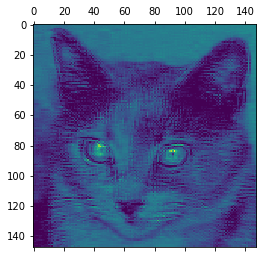

In [ ]:
#視覺化第4個channel的響應圖
plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')

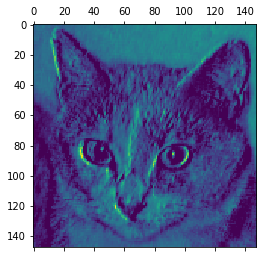

In [ ]:
#視覺化第7個channel的響應圖
plt.matshow(first_layer_activation[0, :, :, 7], cmap='viridis')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide


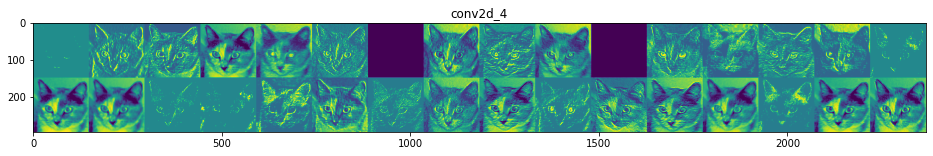

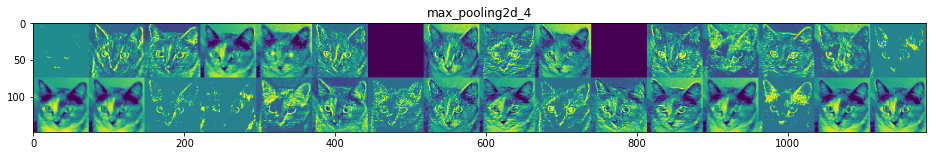

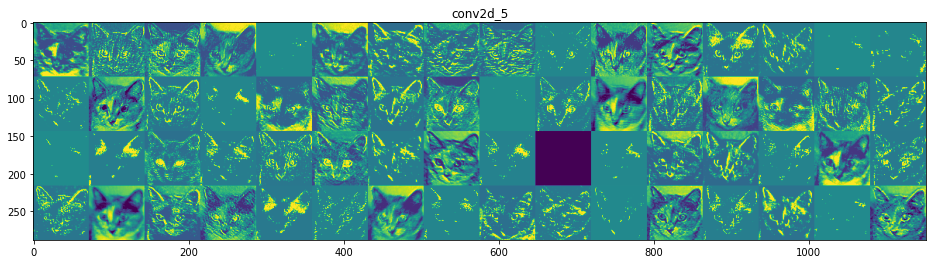

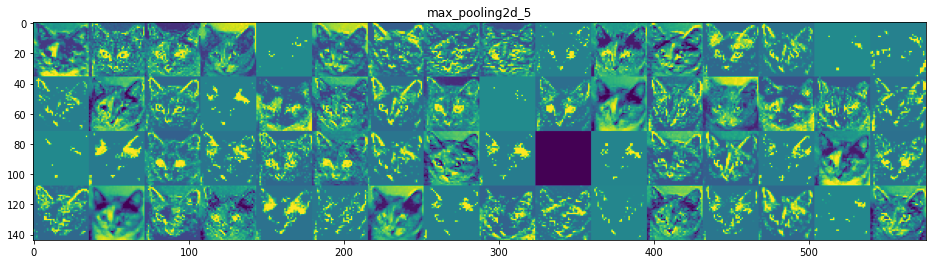

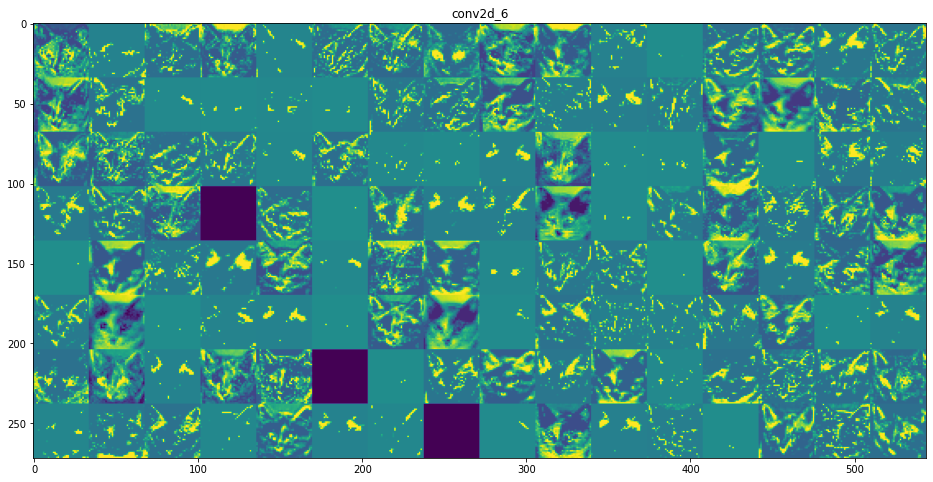

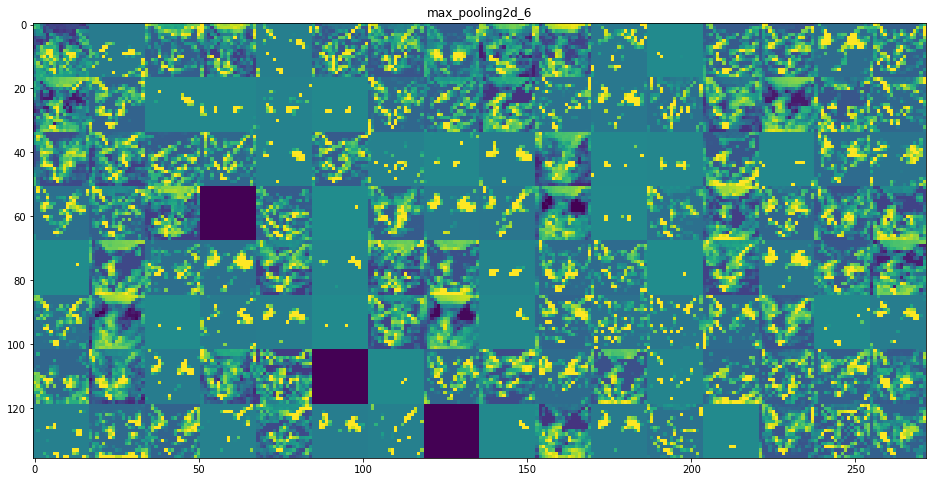

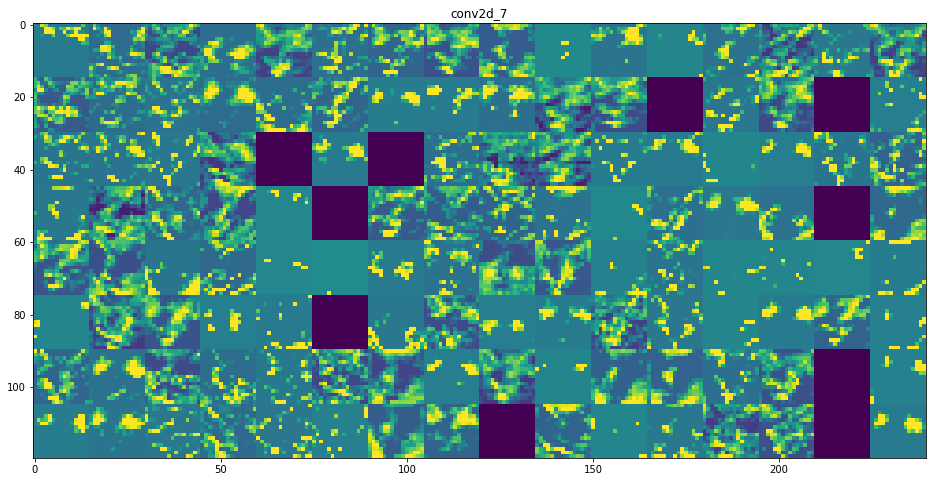

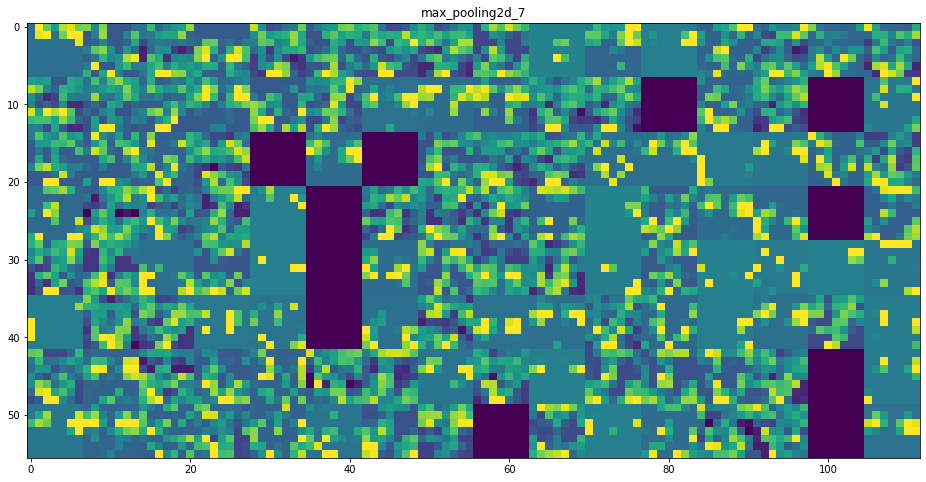

In [ ]:
#視覺化每個啟動函數輸出中每個channel的響應圖
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]

    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

In [ ]:
#5-4-2 視覺化convnet的filter
from keras.applications import VGG16
from keras import backend as K

In [ ]:
#建立過濾器視覺化的損失函數張量
model  = VGG16(weights='imagenet', include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])


58892288/58889256 [==============================] - 3s 0us/step


In [ ]:
#取得損失值(loss)相對於輸入的梯度
grads = K.gradients(loss, model.input)[0]

In [ ]:
#梯度正規化
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [ ]:
#建立一個函數輸入張量，輸出損失和梯度
iterate = K.function([model.input], [loss, grads])

import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [ ]:
#透過隨積梯度下降實作損失最大化
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128

step = 1.
for i in range(40):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step

In [ ]:
#將張量轉換為影像
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    x += 0.5
    x = np.clip(x, 0, 1)

    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [ ]:
#建立過濾器視覺化的函數
def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    grads = K.gradients(loss, model.input)[0]

    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    iterate = K.function([model.input], [loss, grads])

    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128

    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step

    img = input_img_data[0]
    return deprocess_image(img)

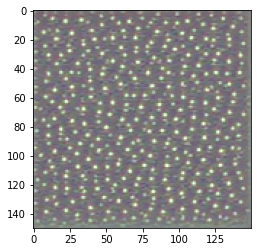

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(generate_pattern('block3_conv1', 0))

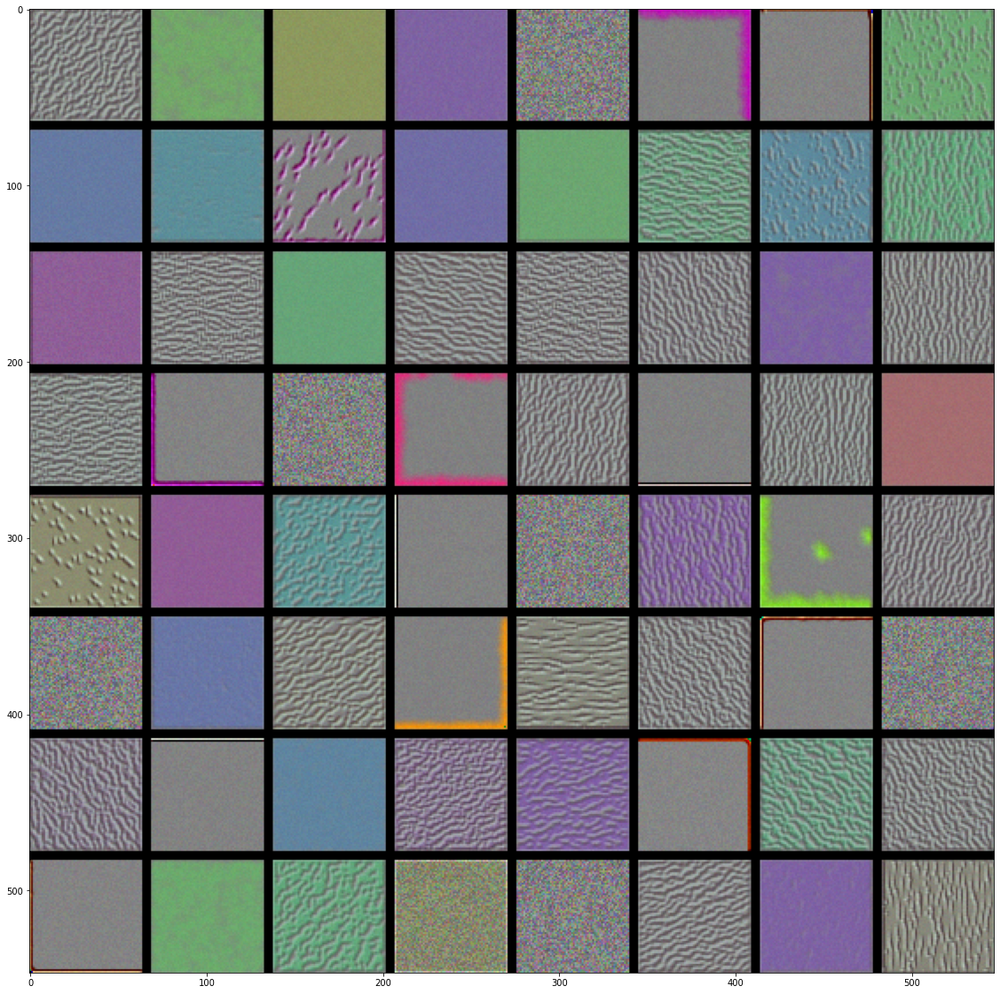

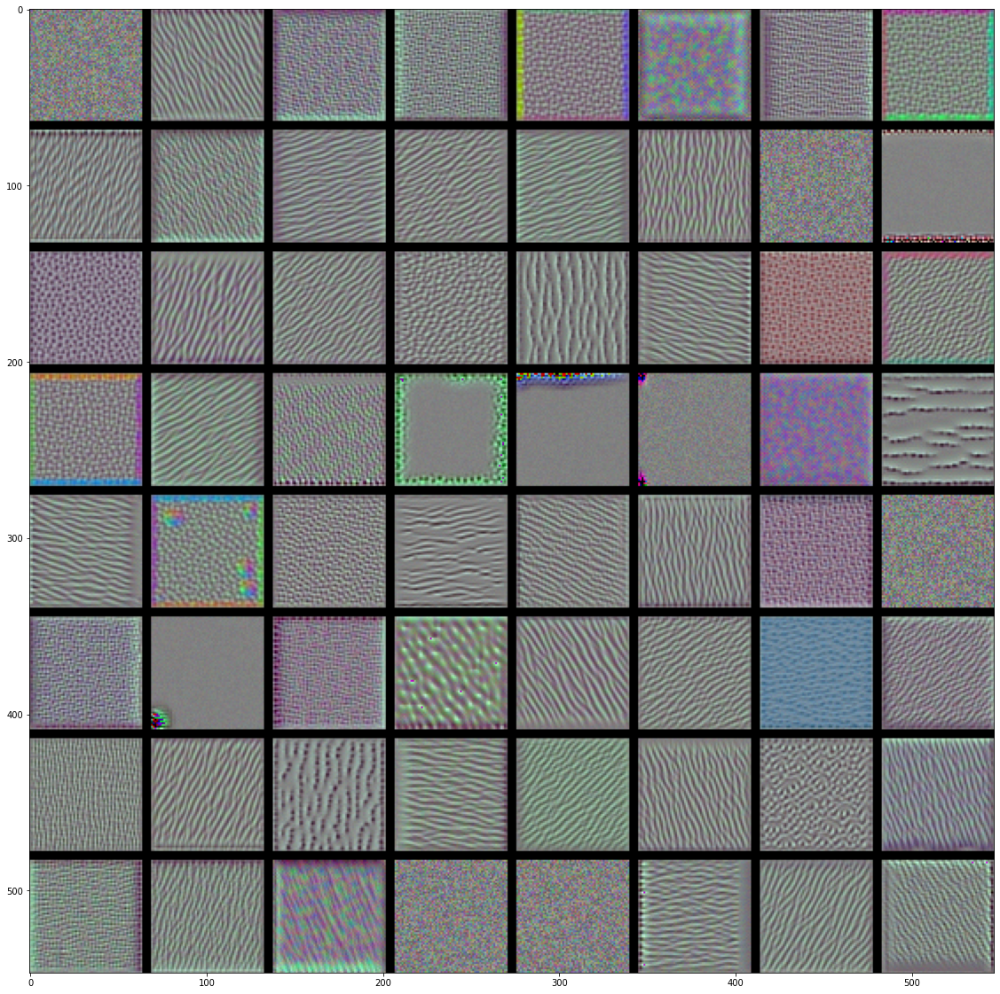

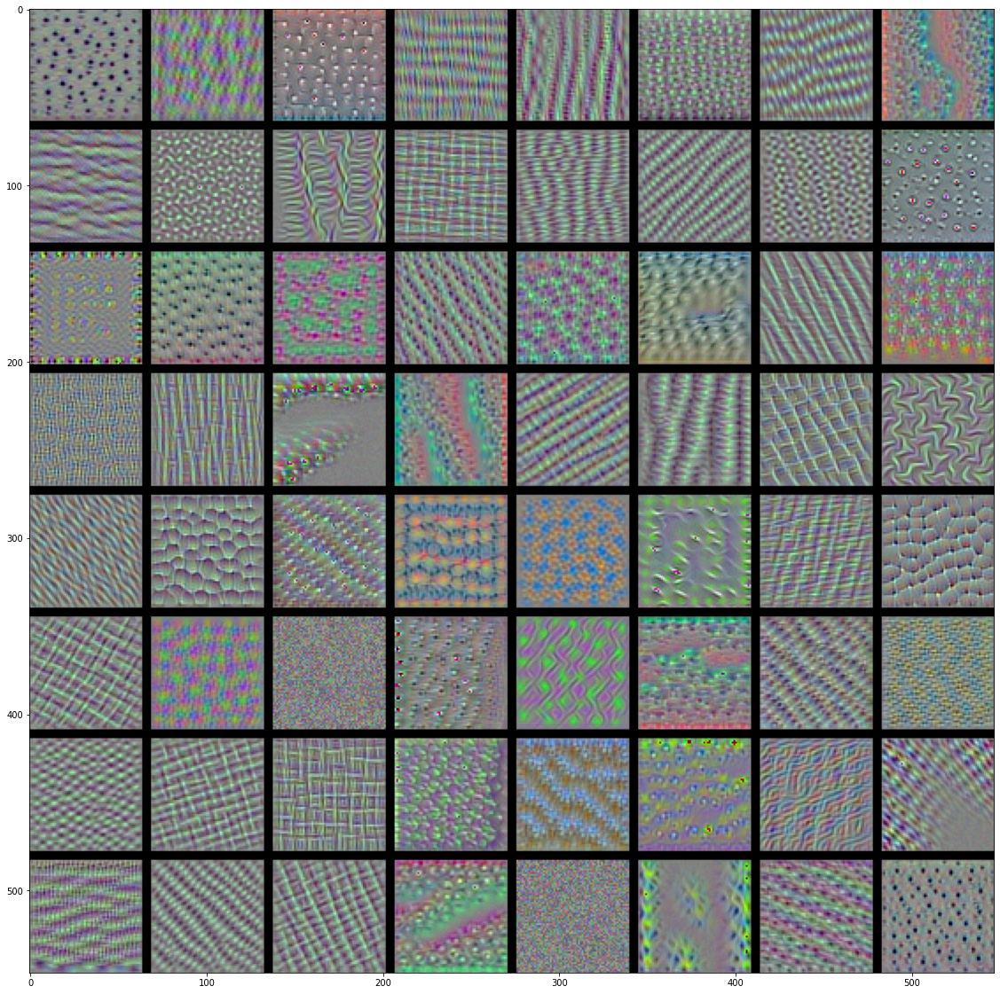

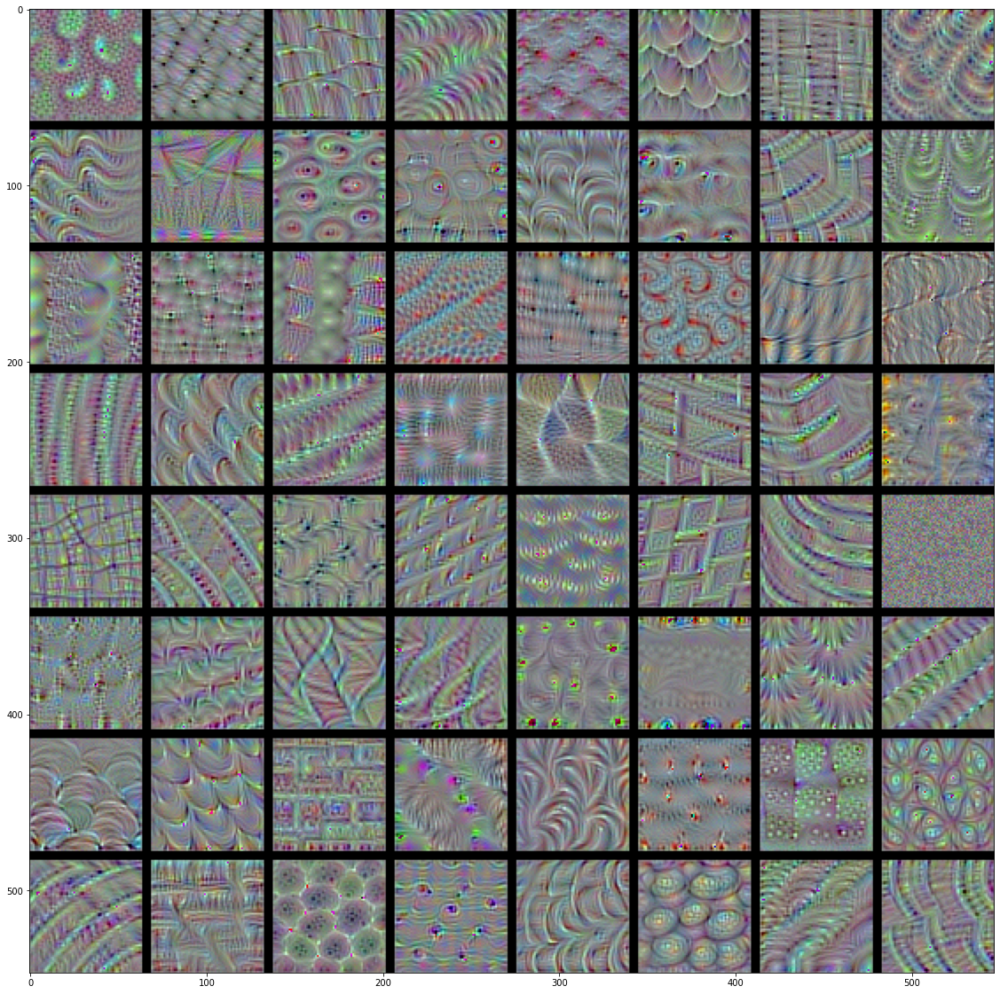

In [ ]:
#產生一層中所有過濾器響應pattern
for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
    size = 64
    margin = 5

    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    for i in range(8):
        for j in range(8):
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    plt.figure(figsize=(20, 20))
    #plt.imshow(results)
    plt.imshow((results * 255).astype(np.uint8))
    plt.show()

In [ ]:
#5-4-3 視覺化類別激活熱圖
from keras.applications import VGG16
model  = VGG16(weights='imagenet')

553467904/553467096 [==============================] - 19s 0us/step


In [ ]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
#預先處理VGG16的輸入影像
img_path = '/content/gdrive/My Drive/Colab Notebooks/Deep Learning with Python/Elephant_african.jpg' #請隨便找一張圖測試
img = image.load_img(img_path, target_size=(224, 224))
print(type(img))
print(img.size)

<class 'PIL.Image.Image'>
(224, 224)


In [ ]:
x = image.img_to_array(img)
print(x.shape)

(224, 224, 3)


In [ ]:
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

In [ ]:
#使用VGG神經網路預測圖片類別
preds = model.predict(x)
print('預測結果:', decode_predictions(preds, top=3)[0])

40960/35363 [==================================] - 0s 0us/step
預測結果: [('n02504013', 'Indian_elephant', 0.46549717), ('n02504458', 'African_elephant', 0.3621287), ('n01871265', 'tusker', 0.10352825)]


In [ ]:
#得到預測結果的類別索引值
np.argmax(preds[0])

385

In [ ]:
#設定Grad-CAM演算法
from keras import backend as K
indian_elephant_output = model.output[:, 385]

last_conv_layer = model.get_layer('block5_conv3')

grads = K.gradients(indian_elephant_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([x])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)

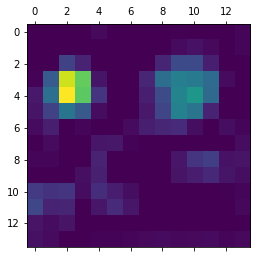

In [ ]:
#熱圖後處理
import matplotlib.pyplot as plt
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

In [ ]:
#將熱圖與原始影像疊加在一起並儲存
import cv2

img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = heatmap * 0.4 + img
cv2.imwrite('/content/gdrive/My Drive/Colab Notebooks/Deep Learning with Python/Elephant_african_cam.jpg', superimposed_img)

True